### Домашнє завдання: Пониження розмірностей для Аналізу Портретів Клієнтів

#### Контекст
В цьому ДЗ ми попрацюємо з методами пониження розмірності на наборі даних для задачі аналізу портретів клієнтів (Customer Personality Analysis). **В попередньому ДЗ ми працювали з цими даними використовуючи кластеризацію, зараз використаємо кластеризацію і візуалізауємо результати з різними методами.**

Customer Personality Analysis - це аналіз різних сегментів клієнтів компанії. Цей аналіз дозволяє бізнесу краще розуміти своїх клієнтів і полегшує процес адаптації продуктів під конкретні потреби, поведінку та інтереси різних типів клієнтів.

Аналіз портретів клієнтів допомагає бізнесу змінювати свій продукт на основі цільової аудиторії, розділеної на різні сегменти. Наприклад, замість того, щоб витрачати гроші на маркетинг нового продукту для всіх клієнтів у базі даних компанії, бізнес може проаналізувати, який сегмент клієнтів найімовірніше придбає продукт, і потім зосередити маркетингові зусилля лише на цьому сегменті.

#### Вхідні дані
Вам надано набір даних з такими атрибутами:

**Характеристики користувачів:**
- `ID`: Унікальний ідентифікатор клієнта
- `Year_Birth`: Рік народження клієнта
- `Education`: Рівень освіти клієнта
- `Marital_Status`: Сімейний стан клієнта
- `Income`: Річний дохід домогосподарства клієнта
- `Kidhome`: Кількість дітей у домогосподарстві клієнта
- `Teenhome`: Кількість підлітків у домогосподарстві клієнта
- `Dt_Customer`: Дата реєстрації клієнта у компанії
- `Recency`: Кількість днів з моменту останньої покупки клієнта
- `Complain`: 1, якщо клієнт скаржився за останні 2 роки, 0 - якщо ні

**Продукти:**
- `MntWines`: Сума, витрачена на вино за останні 2 роки
- `MntFruits`: Сума, витрачена на фрукти за останні 2 роки
- `MntMeatProducts`: Сума, витрачена на м'ясні продукти за останні 2 роки
- `MntFishProducts`: Сума, витрачена на рибні продукти за останні 2 роки
- `MntSweetProducts`: Сума, витрачена на солодощі за останні 2 роки
- `MntGoldProds`: Сума, витрачена на золото за останні 2 роки

**Акції:**
- `NumDealsPurchases`: Кількість покупок, зроблених з використанням знижок
- `AcceptedCmp1`: 1, якщо клієнт прийняв пропозицію у першій кампанії, 0 - якщо ні
- `AcceptedCmp2`: 1, якщо клієнт прийняв пропозицію у другій кампанії, 0 - якщо ні
- `AcceptedCmp3`: 1, якщо клієнт прийняв пропозицію у третій кампанії, 0 - якщо ні
- `AcceptedCmp4`: 1, якщо клієнт прийняв пропозицію у четвертій кампанії, 0 - якщо ні
- `AcceptedCmp5`: 1, якщо клієнт прийняв пропозицію у п'ятій кампанії, 0 - якщо ні
- `Response`: 1, якщо клієнт прийняв пропозицію в останній кампанії, 0 - якщо ні

**Взаємодія з компанією:**
- `NumWebPurchases`: Кількість покупок, зроблених через вебсайт компанії
- `NumCatalogPurchases`: Кількість покупок, зроблених за каталогом
- `NumStorePurchases`: Кількість покупок, зроблених безпосередньо у магазинах
- `NumWebVisitsMonth`: Кількість відвідувань вебсайту компанії за останній місяць


Для початку, запустіть код нижче. Всі ці кроки ми робили в попередньому ДЗ і для того, щоб результати кластеризації у нас були схожими, потрібно аби передобробка була однаковою.

In [1]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.preprocessing import StandardScaler

In [2]:
# 1. Завантаження даних
df = pd.read_csv('data/marketing_campaign.csv', sep='\t')

# 2. Обробка пропущених значень
df['Income_not_filled'] = df.Income.isna()
df.Income = df.Income.fillna(-1)

# 3. Обробка дати реєстрації
df.Dt_Customer = pd.to_datetime(df.Dt_Customer, format='%d-%m-%Y')
today = df.Dt_Customer.max()
df['days_lifetime'] = (today - df.Dt_Customer).dt.days
df['years_customer'] = df.Year_Birth.apply(lambda x: today.year - x)

# 4. Категоризація рівня освіти
df_education = pd.get_dummies(df.Education, prefix='education').astype(int)
df = pd.concat([df, df_education], axis=1)

# 5. Очищення сімейного стану
marital_status_map = {'Alone': 'Single', 'Absurd': 'Else', 'YOLO': 'Else'}
df['Marital_Status_clean'] = df.Marital_Status.map(marital_status_map)
df_ms = pd.get_dummies(df.Marital_Status_clean, prefix='marital').astype(int)
df = pd.concat([df, df_ms], axis=1)

# 6. Форматування доходу і видалення викиду
df.Income = df.Income.astype(int)
df = df[df.Income != 666666]

# 7. Створення фінального набору даних
X = df.drop(['ID', 'Dt_Customer', 'Education', 'Marital_Status', 'Marital_Status_clean'], axis=1)
X.reset_index(drop=True, inplace=True)

### Завдання 1: Виконання кластеризації та пониження розмірності для візуалізації результатів

Ваше завдання — провести кластеризацію клієнтів та візуалізувати результати кластеризації, використовуючи метод головних компонент (PCA) для пониження розмірності даних.

#### Інструкції:

1. **Вибір ключових характеристик:**
   Давайте обмежимось тільки наступними хараткеристиками для кластеризації цього разу:
   - `Income`: Річний дохід домогосподарства клієнта
   - `Recency`: Кількість днів з моменту останньої покупки клієнта
   - `NumStorePurchases`: Кількість покупок, зроблених безпосередньо у магазинах
   - `NumDealsPurchases`: Кількість покупок, зроблених з використанням знижок
   - `days_lifetime`: Кількість днів з моменту реєстрації клієнта у компанії
   - `years_customer`: Вік клієнта
   - `NumWebVisitsMonth`: Кількість відвідувань вебсайту компанії за останній місяць
   Відберіть в наборі даних `X` лише ці характеристики.

2. **Стандартизація даних:**
   Використайте метод `StandardScaler` для стандартизації значень обраних характеристик.
   
   **Чому не MinMaxScaler:**
   - Для PCA краще використовувати StandardScaler, бо він вирівнює дисперсію ознак, на відміну від MinMaxScaler, що просто масштабує значення без врахування варіації.

   - Для K-Means також краще використовувати StandardScaler, бо алгоритм чутливий до масштабів: фічі з більшими значеннями сильніше впливають на обчислення відстаней, що може спотворити кластери.

3. **Кластеризація:**
   Проведіть кластеризацію клієнтів, використовуючи метод `KMeans` з трьома кластерами.

4. **Пониження розмірності:**
   Використайте метод головних компонент (PCA) для пониження розмірності даних до трьох компонент.

5. **Візуалізація результатів:**
   Використовуючи plolty express побудуйте 3D-графік розподілу клієнтів у просторі трьох головних компонент, де кольором позначено кластери.

6. **Опишіть, що спостерігаєте:**
   Чи кластеризація чітко розділила дані?

Далі ми детальніше проінтерпретуємо результати візуалізації і пониження розмірностей.

In [3]:
X_final = X[['Income', 'Recency', 'NumDealsPurchases', 'NumStorePurchases', 'days_lifetime', 
             'years_customer', 'NumWebVisitsMonth']]

In [4]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_final)

In [5]:
kmeans = KMeans(n_clusters=3, random_state=42)
labels = kmeans.fit_predict(X_scaled)

df['Cluster_scaled'] = labels

In [6]:
silhouette = silhouette_score(X_scaled, labels)
print(f'Silhouette Coefficient for the data Dataset Clusters: {silhouette:.2f}')

Silhouette Coefficient for the data Dataset Clusters: 0.21


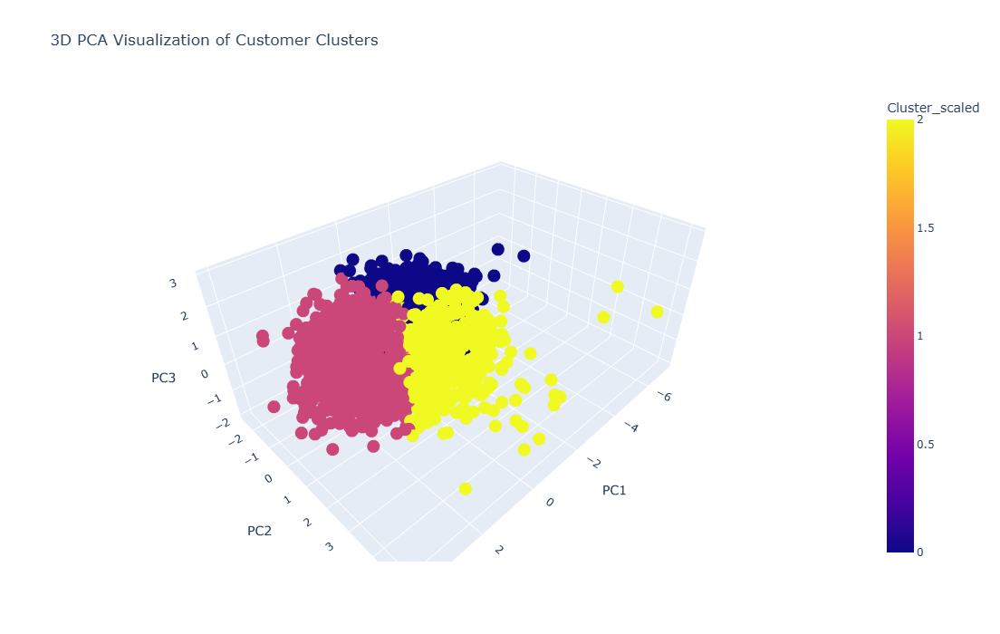

In [7]:
# Обчислюємо PCA на 3 компоненти
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

df['PC1'] = X_pca[:, 0]
df['PC2'] = X_pca[:, 1]
df['PC3'] = X_pca[:, 2]

# 3D-графік
fig = px.scatter_3d(
    df,
    x='PC1',
    y='PC2',
    z='PC3',
    color='Cluster_scaled',
    title='3D PCA Visualization of Customer Clusters',
    color_discrete_sequence=px.colors.qualitative.Set1,
    hover_data=df.columns
)

fig.update_layout(
    width=900,
    height=700
)

fig.show()

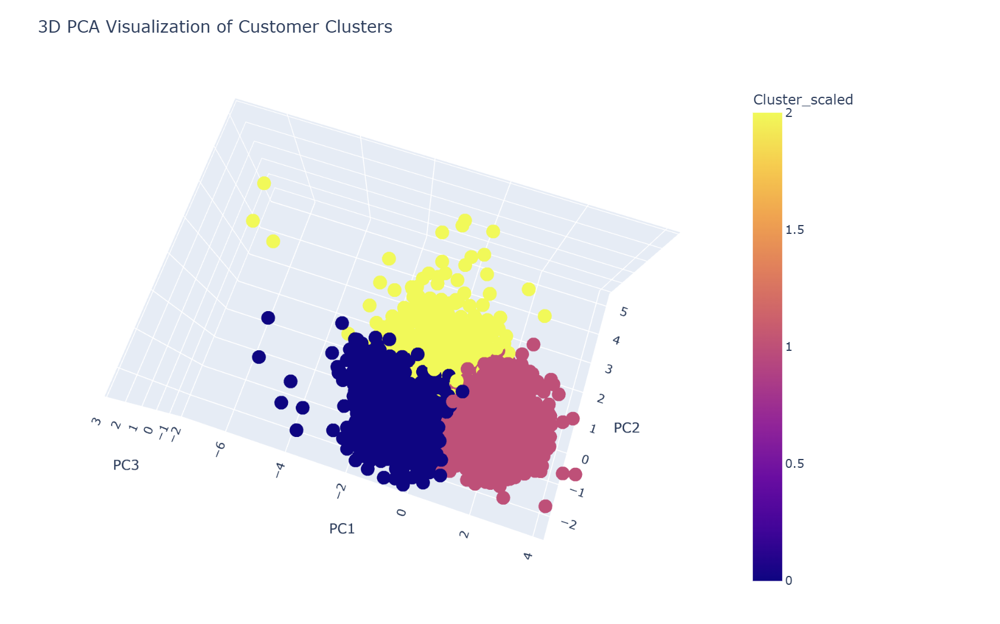

**Висновок:**
Кластери не є чітко розділеними, але мають певний сенс: алгоритм знаходить групи з різними поведінковими патернами, хоча вони не формують різко відокремлених сегментів.
Для маркетингових даних це нормально — поведінка клієнтів рідко утворює чіткі «острови».

### Завдання 2: Аналіз результатів пониження розмірності

1. **Розрахунок частки поясненої дисперсії:**
   Визначте, яка частка загальної варіації даних пояснюється кожною з трьох головних компонент (PC1, PC2, PC3) за допомогою атрибуту `explained_variance_ratio_` об'єкта PCA. Виведіть результат на екран.

2. **Розрахунок кумулятивної частки поясненої дисперсії:**
   Обчисліть кумулятивну частку поясненої дисперсії для трьох головних компонент, щоб зрозуміти, скільки варіації даних пояснюється першими кількома компонентами.

In [8]:
explained = pca.explained_variance_ratio_

print("Explained variance ratio for each component:")
print(f"PC1: {explained[0]:.4f}")
print(f"PC2: {explained[1]:.4f}")
print(f"PC3: {explained[2]:.4f}")

Explained variance ratio for each component:
PC1: 0.3185
PC2: 0.1966
PC3: 0.1434


In [9]:
cumulative = np.cumsum(explained)

print("\nCumulative explained variance:")
print(f"PC1: {cumulative[0]:.4f}")
print(f"PC1 + PC2: {cumulative[1]:.4f}")
print(f"PC1 + PC2 + PC3: {cumulative[2]:.4f}")


Cumulative explained variance:
PC1: 0.3185
PC1 + PC2: 0.5151
PC1 + PC2 + PC3: 0.6585


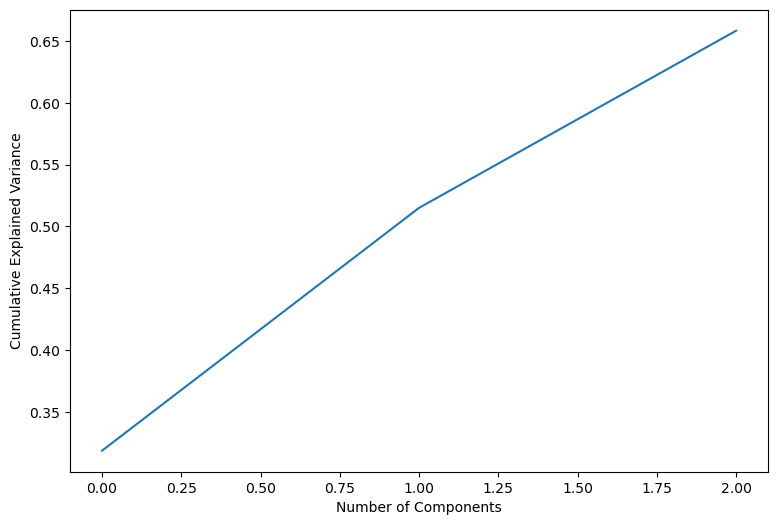

In [10]:
plt.figure(figsize=(9, 6))
plt.plot(np.cumsum(explained))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show();

**Висновок:** 

Після стандартизації даних було виконано PCA з трьома компонентами. 
Перша головна компонента (PC1) пояснює 31.85% варіації, друга (PC2) - 19.66%, третя (PC3) - 14.34%. 
Кумулятивно три компоненти пояснюють 65.85% загальної дисперсії, що є достатнім для візуалізації, але не забезпечує повного відтворення структури даних.
3D‑візуалізація у просторі головних компонент показує часткове перекриття кластерів, що узгоджується з низьким значенням силует‑коефіцієнта (0.21). Це свідчить про те, що сегментація є слабко вираженою, а дані не мають чітко відокремлених груп.

### Завдання 3: Інтерпретація "Loadings"

Продовжуємо інтерпретацію результатів `PCA`і познайомимось з новим поняттям `loadings`, яке допоможе нам знайти звʼязок між головними компонентами і оригінальними ознаками в наборі даних.

Ми зараз побудували візуалізацію кластерів точок даних в просторі трьох головних компонент. Але хочеться знайти звʼязок між головними компонентами і оригінальними ознаками. Для розуміння, які початкові характеристики даних мають найбільший вплив на ці головні компоненти, ми можемо використати атрибут `components_` методу `PCA`.

#### Що таке `pca.components_`?

`pca.components_` — це масив, який містить коефіцієнти (або "ваги"), що показують внесок кожної вихідної ознаки у кожну з головних компонент. Ці коефіцієнти ще називаються **"loading"** або "навантаженнями" компонент.

- **Loadings** (`навантаження`) відображають важливість кожної змінної (ознаки) для відповідної головної компоненти. Вони показують, яким чином змінні поєднуються, щоб утворити нові, зменшені вимірювання.
- Якщо коефіцієнт має високе абсолютне значення (як позитивне, так і негативне), це вказує на те, що відповідна змінна сильно впливає на головну компоненту.

#### Саме завдання
Ваше завдання — обчислити "навантаження" для кожної з головних компонент і інтерпретувати результати.

1. **Обчислення loadings для компонент:**
   Використайте атрибут `components_` об'єкта PCA для створення DataFrame, який відображатиме внесок кожної вихідної ознаки в кожну головну компоненту.

2. **Інтерпретація результатів:**
   Виведіть значення "навантажень" і проаналізуйте, які ознаки найбільше впливають на кожну головну компоненту.

In [11]:
loadings = pd.DataFrame(
    pca.components_,
    columns=X_final.columns,
    index=['PC1', 'PC2', 'PC3']
)

print(loadings)

       Income   Recency  NumDealsPurchases  NumStorePurchases  days_lifetime  \
PC1  0.584238  0.010075          -0.198661           0.488621      -0.132683   
PC2  0.165255  0.036810           0.608119           0.384659       0.602585   
PC3 -0.044491  0.975799          -0.034808          -0.080566      -0.022223   

     years_customer  NumWebVisitsMonth  
PC1        0.189393          -0.571728  
PC2        0.208946           0.216329  
PC3        0.193368          -0.015815  


**Висновок:**
Аналіз навантажень PCA показав, що перша головна компонента (PC1) відображає фінансову активність клієнтів: високі значення мають клієнти з більшим доходом, частими офлайн-покупками та низькою онлайн-активністю.

Друга компонента (PC2) описує поведінку клієнтів, які давно взаємодіють із брендом і активно купують товари зі знижками.

Третя компонента (PC3) майже повністю визначається ознакою Recency і відображає давність останньої покупки.

Таким чином, PCA виділяє три ключові латентні фактори: фінансова активність, промо-чутливість/лояльність та давність взаємодії.

### Завдання 4

Давайте проаналізуємо "навантаження" (**loadings**) для трьох головних компонент після вилучення ознаки `Income`. Це допоможе нам зрозуміти, як змінилася важливість інших ознак для кожної головної компоненти, коли одна з ключових характеристик (`Income`) була вилучена.

#### Кроки для проведення аналізу і ваше завдання:

1. Видаліть ознаку `Income` з нашого набору даних `X` і повторно виконайте PCA (метод головних компонент) для отримання нових "навантажень".

2. Обчисліть нові "навантаження" для трьох головних компонент на наборі даних без `Income`

3. Проаналізуйте, які ознаки мають найбільший вплив на кожну головну компоненту після вилучення `Income`.

4. Перегляньте, наскільки кожна з головних компонент пояснює дисперсію в даних без ознаки `Income`.

In [12]:
# 1. Видаляємо Income
X_no_income = X_final.drop(columns=['Income'])

# 2. Стандартизуємо
scaler = StandardScaler()
X_scaled_no_income = scaler.fit_transform(X_no_income)

# 3. PCA
pca_no_income = PCA(n_components=3)
pca_no_income.fit(X_scaled_no_income)

# 4. Loadings
loadings_no_income = pd.DataFrame(
    pca_no_income.components_,
    columns=X_no_income.columns,
    index=['PC1', 'PC2', 'PC3']
)

print("Explained variance ratio:", pca_no_income.explained_variance_ratio_)
print(loadings_no_income)

Explained variance ratio: [0.27392228 0.21444861 0.16684415]
      Recency  NumDealsPurchases  NumStorePurchases  days_lifetime  \
PC1 -0.014416           0.445591          -0.381237       0.383782   
PC2  0.074880           0.461539           0.629202       0.467914   
PC3  0.990219          -0.061793          -0.111063       0.006776   

     years_customer  NumWebVisitsMonth  
PC1       -0.177270           0.690787  
PC2        0.393576          -0.107863  
PC3        0.056285           0.009910  


**Висновок:**

Після вилучення ознаки Income було повторно виконано PCA. 

Перша компонента (PC1) стала описувати онлайн‑активність клієнтів та їхню промо‑поведінку, протиставлену офлайн‑покупкам. 

Друга компонента (PC2) відображає лояльність клієнтів, їхню тривалу взаємодію з брендом та активність у знижках. 

Третя компонента (PC3) майже повністю визначається ознакою Recency і відображає давність останньої покупки.

Пояснена дисперсія трьох компонент становить 27.39%, 21.44% та 16.68% відповідно, що у сумі дає 65.8%. Це свідчить про те, що вилучення Income не призвело до суттєвої втрати інформації, але змінило інтерпретацію латентних факторів.

### Завдання 5: Візуалізація кластеризації за допомогою t-SNE

Ваше завдання — використати метод t-SNE для візуалізації результатів кластеризації клієнтів у двовимірному просторі. Метод t-SNE допомагає знизити розмірність даних та зберегти локальні структури в даних, що робить його ефективним для візуалізації високорозмірних даних. Ми також зможемо порівняти результат цього методу з РСА.

1. Використайте метод t-SNE для зниження розмірності до 2х вимірів даних, які включають ознаки всі, що і в завданні 1, а також були відмасштабовані перед пониженням розмірностей.

2. Створіть новий DataFrame з координатами, отриманими після застосування t-SNE, та додайте до нього мітки кластерів.

3. Побудуйте інтерактивний 2D-графік розподілу клієнтів, де кольором буде позначено різні кластери і проаналізуйте графік з рекомендаціями нижче (можливо треба буде вивести додаткові візуалізації чи таблиці для інтерпретації, але треба прям зрозуміти, які ознаки формують який кластер і чим кластери відрізняються одне від одного).

  **Опишіть отримані кластери з точки зору ознак.**

4. Опишіть відмінність графіка tSNE від PCA.

#### ЯК можна інтерпретувати з t-SNE?

Хоча t-SNE не надає "компонентів" як РСА, він забезпечує низьковимірне представлення даних, яке можна візуально інтерпретувати:

- **Кластери:** t-SNE особливо добре показує кластери подібних точок. Якщо ви бачите чітко визначені кластери на графіку t-SNE, це свідчить про наявність груп схожих спостережень у ваших даних. Проаналізувати їх можемо, якщо додамо дані в `hover_data` або якщо якісь з даних виведемо як розмір чи форма точок на візуалізації. Також корисно може бути вивести середні значення ознак по кластерам.
- **Локальна структура:** Відносне розташування точок одного кластеру на графіку t-SNE може допомогти вам зрозуміти, які дані подібні між собою.
- **Глобальна структура:** Будьте обережні; t-SNE менш надійний для відображення глобальних структур (наприклад, відстаней між кластерами) у порівнянні з PCA, бо t-SNE націлений на збереження саме локальних структур.

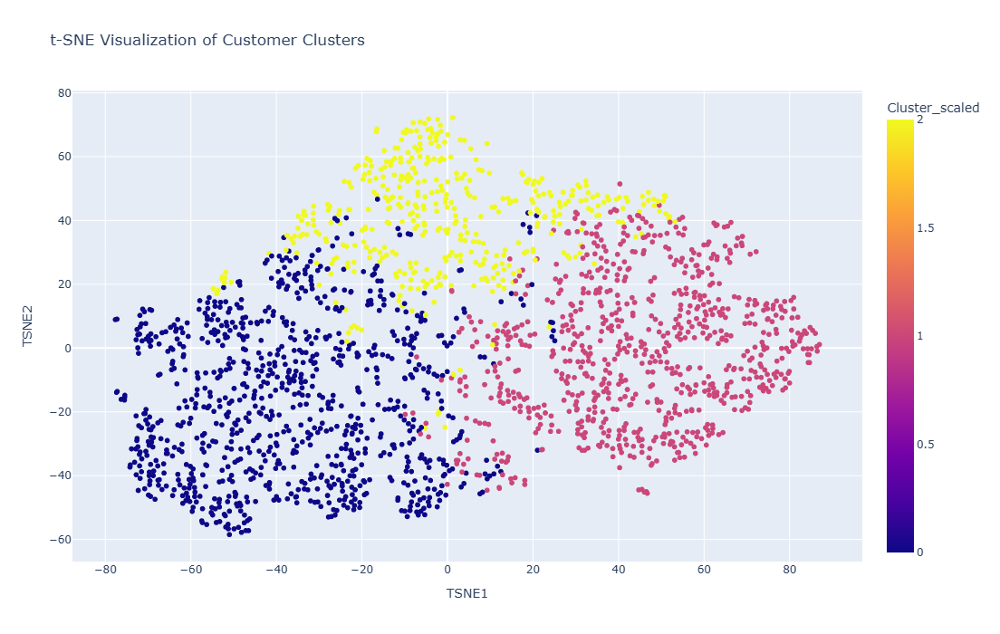

In [13]:
# 1. t-SNE на стандартизованих даних
tsne = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate=200,
    max_iter=2000,
    random_state=42
)

tsne_results = tsne.fit_transform(X_scaled)

# 2. Новий DataFrame
df['TSNE1'] = tsne_results[:, 0]
df['TSNE2'] = tsne_results[:, 1]

# 3. Інтерактивний графік
fig = px.scatter(
    df,
    x='TSNE1',
    y='TSNE2',
    color='Cluster_scaled',
    title='t-SNE Visualization of Customer Clusters',
    color_discrete_sequence=px.colors.qualitative.Set1,
    hover_data=df.columns
)

fig.update_layout(width=900, height=700)
fig.show()

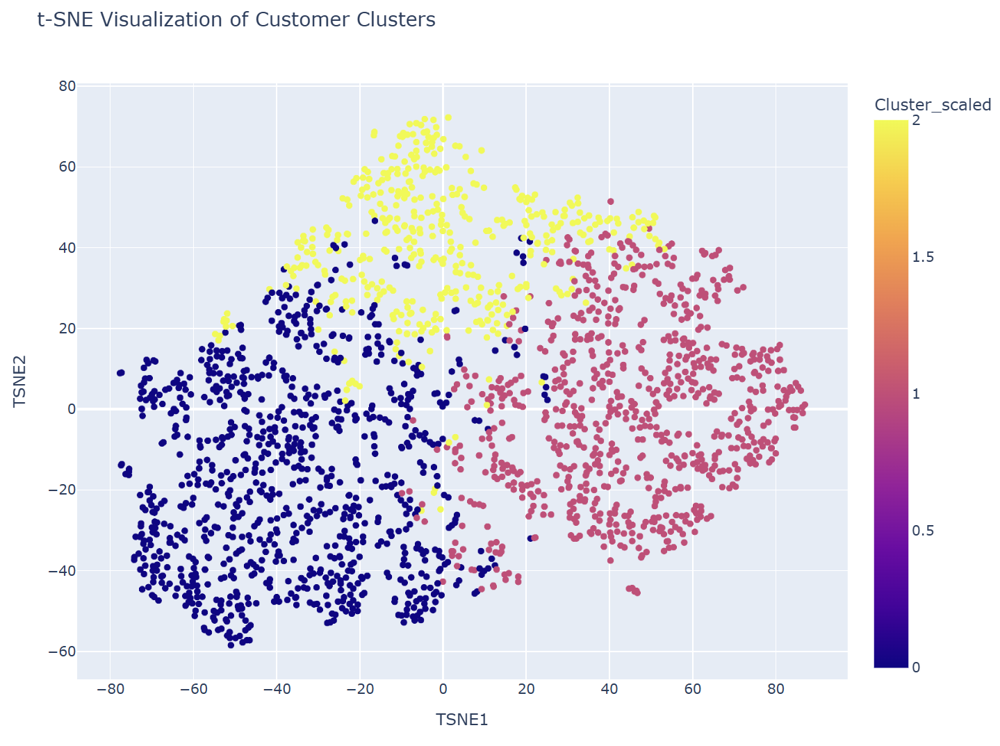

In [14]:
cluster_profile = df.groupby('Cluster_scaled')[X_final.columns].mean().round(2)
cluster_profile

,Income,Recency,NumDealsPurchases,NumStorePurchases,days_lifetime,years_customer,NumWebVisitsMonth
Cluster_scaled,,,,,,,
0,33061.01,48.51,1.81,3.18,312.30,41.92,6.51
1,72551.55,49.35,1.44,8.34,315.25,47.35,3.07
2,51937.72,50.01,5.00,6.70,510.01,48.23,6.87


**Висновок:**
На графіку t‑SNE видно компактні групи клієнтів, що відповідають кластерам, отриманим методом KMeans. Це свідчить про наявність внутрішніх патернів поведінки всередині кожного кластеру.

Аналіз середніх значень ознак у кожному кластері показав, що:
1) Кластер 0 - онлайн‑активні клієнти з нижчим доходом;
2) Кластер 1 - заможні лояльні офлайн‑покупці;
3) Кластер 2 - довгострокові промо‑активні клієнти.

Таким чином, t‑SNE допоміг виявити поведінкові сегменти, які не були очевидними у PCA‑просторі.